# ECE 285 IVR Assignment #4 - Non-local means

## Arik Horodniceanu PID A53285765

In [2]:
%load_ext autoreload
%autoreload 2
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import time
import imagetools.assignment4 as im
%matplotlib notebook

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## 1 Bilateral filter

### 1

In [47]:
x = plt.imread('assets/castle.png')
sig = 10/255
y = x + sig*np.random.randn(*x.shape)

### 2

In [11]:
# Auxillary function to calculate phi(alpha)
def phi(alpha,sigma,c,h=1,p=1):
    # To account for both matrix and scalar alphas
    num = (-1)*(alpha-2*h*(sigma**2))*((alpha-2*h*(sigma**2))>0)
    denom = (2*np.sqrt(2)*h*(sigma**2))/(np.sqrt(c*p))
    return np.exp(num/denom)

# Same function as in assignment4.py
def bilateral_naive(y, sig, s1=2, s2=2, h=1):
    n1, n2 = y.shape[:2]
    c = y.shape[2] if y.ndim == 3 else 1
    x = np.zeros(y.shape)
    Z = np.zeros((n1, n2, *[1] * (y.ndim - 2)))
    for i in range(s1, n1-s1):
        for j in range(s2, n2-s2):
            for k in range(-s1, s1 + 1):
                for l in range(-s2, s2 + 1):
                    dist2 = ((y[i + k, j + l] - y[i, j])**2).mean()
                    x[i,j]+=phi(dist2,sig,c,h)*y[i + k, j + l]
                    Z[i,j]+=phi(dist2,sig,c,h)
    Z[Z == 0] = 1
    x = x / Z
    
    return x


### 3

<IPython.core.display.Javascript object>


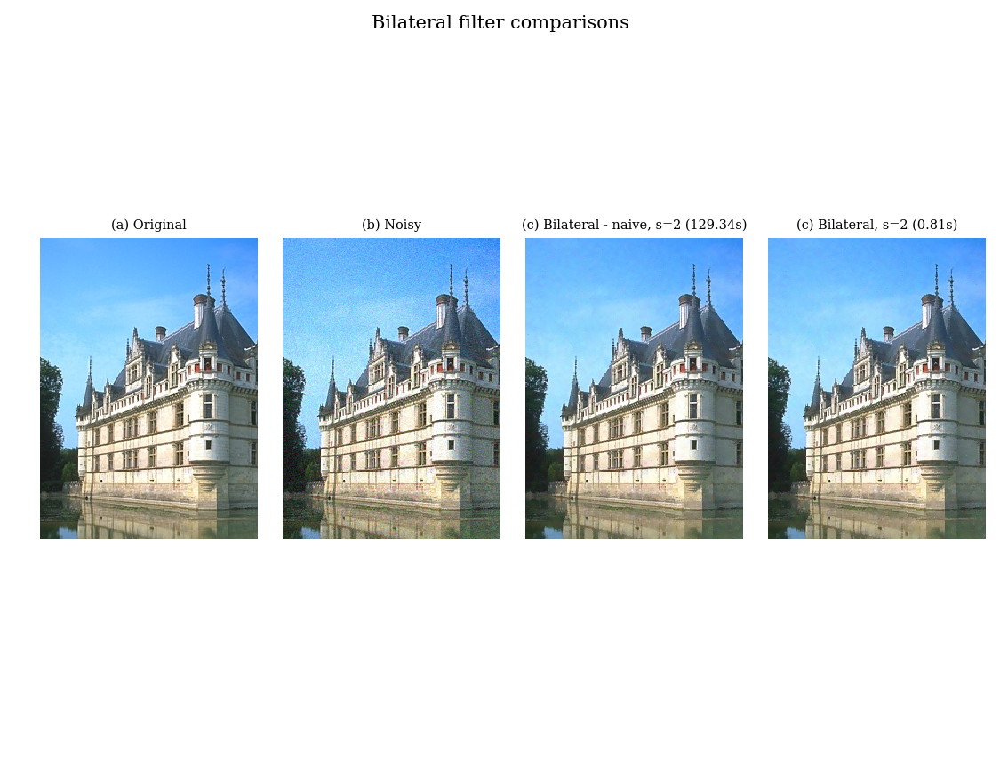

In [42]:

t1=time.time()
yslow=bilateral_naive(y,sig,s1=2,s2=2)
t2=time.time()
tslow="{0:.2f}".format(t2-t1)

t1=time.time()
yfast=bilateral(y,sig,s1=2,s2=2)
t2=time.time()
tfast="{0:.2f}".format(t2-t1)

fig, axes = plt.subplots(ncols=4,figsize=(9, 7), sharex='all', sharey='all')

fig.suptitle('Bilateral filter comparisons', fontsize=12)
axes[0].set_title('(a) Original')
im.show(x, ax=axes[0])

axes[1].set_title('(b) Noisy')
im.show(y, ax=axes[1])

axes[2].set_title('(c) Bilateral - naive, s=2 ('+ tslow +'s)')
im.show(yslow, ax=axes[2])

axes[3].set_title('(c) Bilateral, s=2 ('+ tfast +'s)')
im.show(yfast, ax=axes[3])

<IPython.core.display.Javascript object>


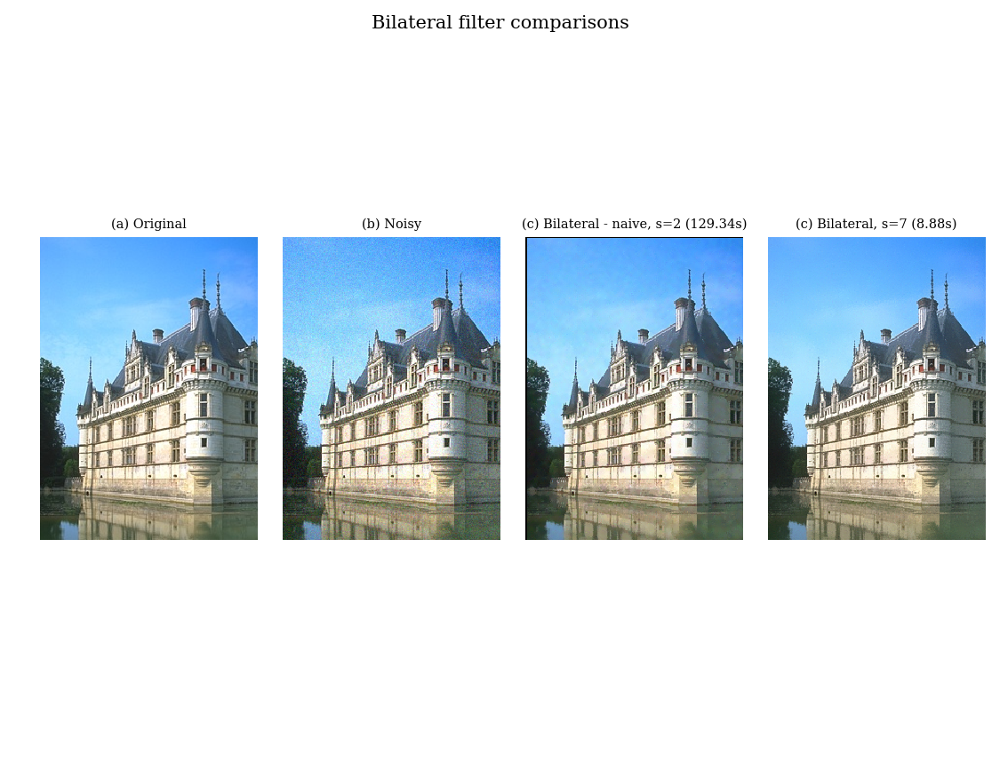

In [44]:
t1=time.time()
yslow=bilateral_naive(y,sig,s1=2,s2=2)
t2=time.time()
tslow="{0:.2f}".format(t2-t1)

t1=time.time()
yfast=bilateral(y,sig,s1=7,s2=7)
t2=time.time()
tfast="{0:.2f}".format(t2-t1)

fig, axes = plt.subplots(ncols=4,figsize=(9, 7), sharex='all', sharey='all')

fig.suptitle('Bilateral filter comparisons', fontsize=12)
axes[0].set_title('(a) Original')
im.show(x, ax=axes[0])

axes[1].set_title('(b) Noisy')
im.show(y, ax=axes[1])

axes[2].set_title('(c) Bilateral - naive, s=2 ('+ tslow +'s)')
im.show(yslow, ax=axes[2])

axes[3].set_title('(c) Bilateral, s=7 ('+ tfast +'s)')
im.show(yfast, ax=axes[3])

Looks similar to what was expected.

### 4

In [9]:
# Same function as in assignment4.py
# I didn't implement mirror, so the default is periodical
def bilateral(y, sig, s1=10, s2=10, h=1, boundary='periodical'):
    n1, n2 = y.shape[:2]
    c = y.shape[2] if y.ndim == 3 else 1
    x = np.zeros(y.shape)
    Z = np.zeros((n1, n2, *[1] * (y.ndim - 2)))
    
    for k in range(-s1, s1 + 1):
        for l in range(-s2, s2 + 1):
            dist2 = np.mean((im.shift(y,k,l,boundary) - y)**2,axis = 2,keepdims = True)
            x+=phi(dist2,sig,c,h)*im.shift(y,k,l,boundary)
            Z+=phi(dist2,sig,c,h)
    Z[Z == 0] = 1
    x = x / Z
    
    return x

### 5

See section 3. This approach is 1-2 orders of magnitude faster than the naive approach, which is expected since matrix operations are optimized in Python.

### 6

<IPython.core.display.Javascript object>


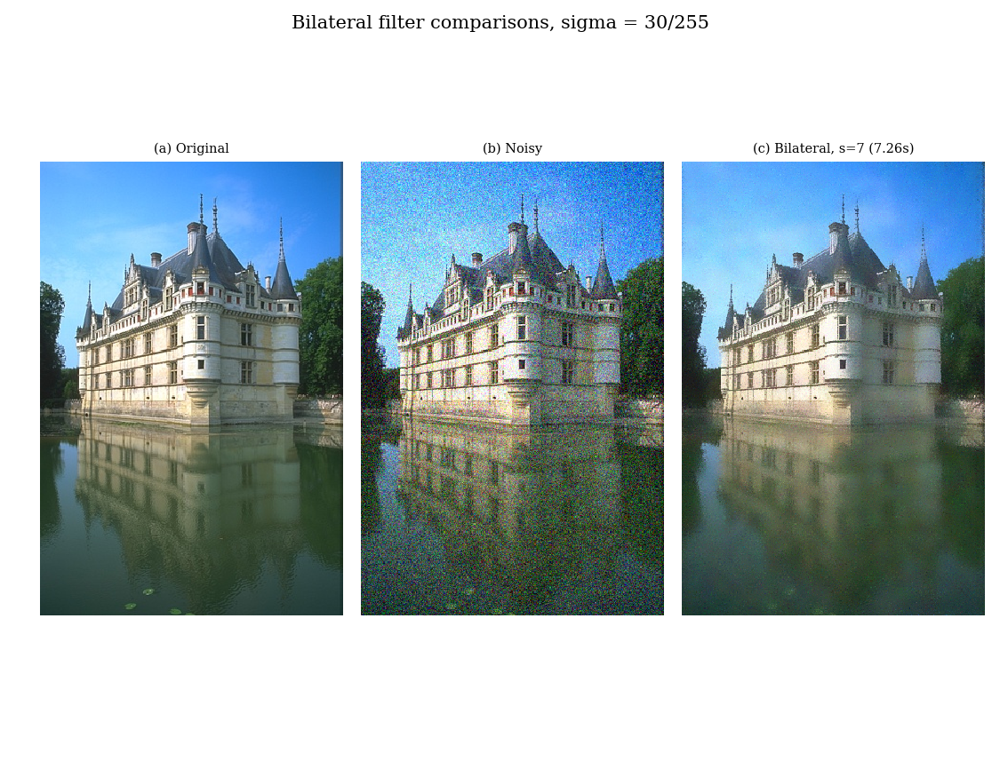

In [45]:
x = plt.imread('assets/castle.png')
sig = 30/255
y = x + sig*np.random.randn(*x.shape)

t1=time.time()
yfast=bilateral(y,sig,s1=7,s2=7)
t2=time.time()
tfast="{0:.2f}".format(t2-t1)

fig, axes = plt.subplots(ncols=3,figsize=(9, 7), sharex='all', sharey='all')

fig.suptitle('Bilateral filter comparisons, sigma = 30/255', fontsize=12)
axes[0].set_title('(a) Original')
im.show(x, ax=axes[0])

axes[1].set_title('(b) Noisy')
im.show(y, ax=axes[1])

axes[2].set_title('(c) Bilateral, s=7 ('+ tfast +'s)')
im.show(yfast, ax=axes[2])

<IPython.core.display.Javascript object>


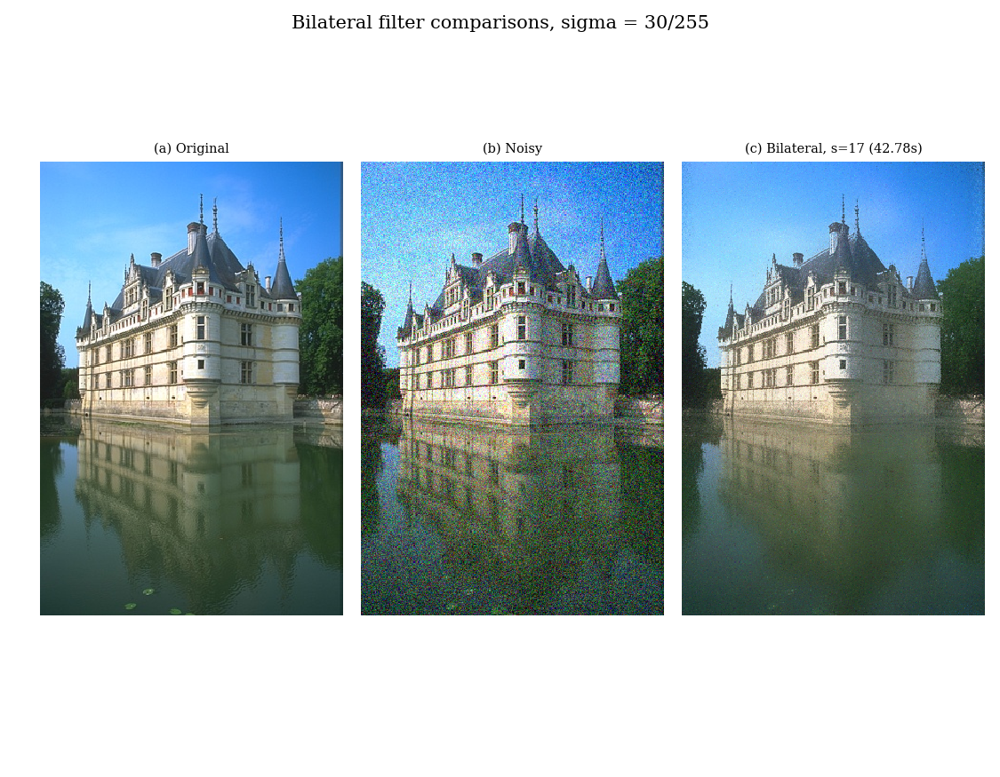

In [46]:
x = plt.imread('assets/castle.png')
sig = 30/255
y = x + sig*np.random.randn(*x.shape)

t1=time.time()
yfast=bilateral(y,sig,s1=17,s2=17)
t2=time.time()
tfast="{0:.2f}".format(t2-t1)

fig, axes = plt.subplots(ncols=3,figsize=(9, 7), sharex='all', sharey='all')

fig.suptitle('Bilateral filter comparisons, sigma = 30/255', fontsize=12)
axes[0].set_title('(a) Original')
im.show(x, ax=axes[0])

axes[1].set_title('(b) Noisy')
im.show(y, ax=axes[1])

axes[2].set_title('(c) Bilateral, s=17 ('+ tfast +'s)')
im.show(yfast, ax=axes[2])

As the noise increases, we can see reconstruction is worse since the resulting image is much smoother. Increasing the window size helps somewhat in removing the noise, but smooths the result further as the average takes into consideration the noise more. 

## 2 NL-means filter

### 7

In [52]:
# Same function as in assignment4.py
def nlmeans_naive(y, sig, s1=2, s2=2, p1=1, p2=1, h=1):
    n1, n2 = y.shape[:2]
    c = y.shape[2] if y.ndim == 3 else 1
    x = np.zeros(y.shape)
    Z = np.zeros((n1, n2, *[1] * (y.ndim - 2)))
    P = (2*p1 + 1)*(2*p2 + 1)
    
    for i in range(s1, n1-s1-p1):
        for j in range(s2, n2-s2-p2):
            for k in range(-s1, s1 + 1):
                for l in range(-s2, s2 + 1):
                    dist2 = 0
                    for u in range(-p1, p1 + 1):
                        for v in range(-p2, p2 + 1):
                            dist2+=((y[i+k+u,j+l+v] - y[i+u,j+v])**2).mean()
                    dist2/=P
                    x[i,j]+=phi(dist2,sig,c,h,P)*y[i + k, j + l]
                    Z[i,j]+=phi(dist2,sig,c,h,P)
                            
    Z[Z == 0] = 1
    x = x / Z
    
    return x

### 8

<IPython.core.display.Javascript object>


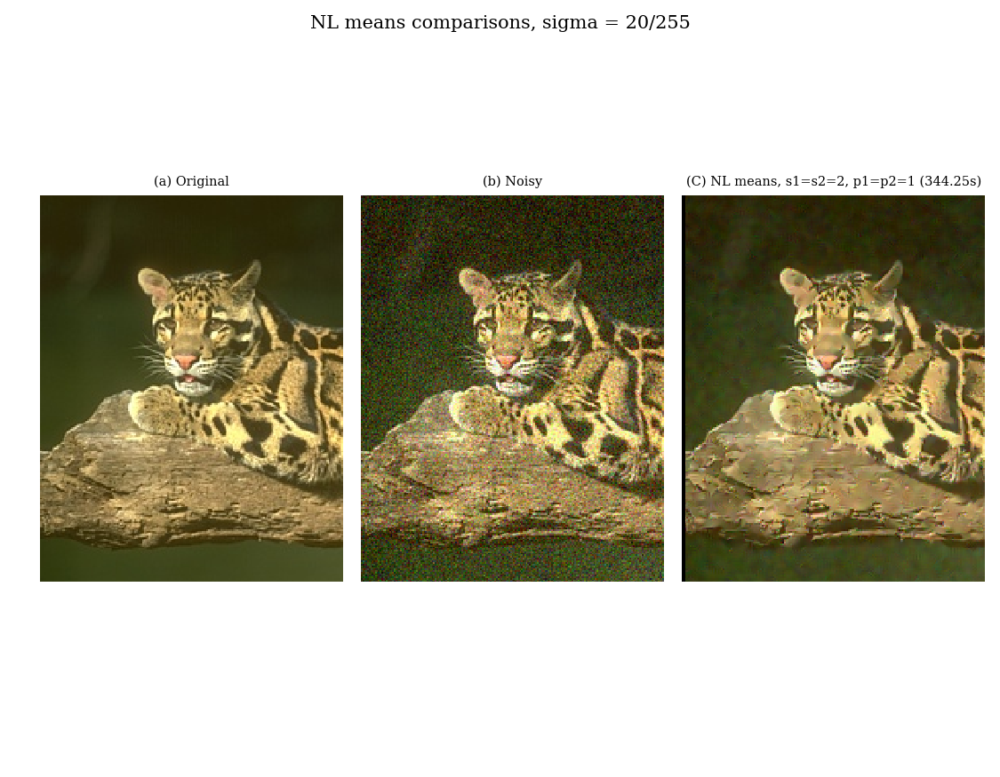

In [54]:
x = plt.imread('assets/leopard.png')
sig = 20/255
y = x + sig*np.random.randn(*x.shape)

t1=time.time()
ysloooow=nlmeans_naive(y,sig,s1=2,s2=2,p1=1,p2=1)
t2=time.time()
tsloooow="{0:.2f}".format(t2-t1)

fig, axes = plt.subplots(ncols=3,figsize=(9, 7), sharex='all', sharey='all')

fig.suptitle('NL means comparisons, sigma = 20/255', fontsize=12)
axes[0].set_title('(a) Original')
im.show(x, ax=axes[0])

axes[1].set_title('(b) Noisy')
im.show(y, ax=axes[1])

axes[2].set_title('(C) NL means, s1=s2=2, p1=p2=1 ('+ tsloooow +'s)')
im.show(ysloooow, ax=axes[2])

Pretty good reconstruction, took only ~$5\frac{1}{2}$ minutes to run.

### 9

In [6]:
# Same function as in assignment4.py
# I didn't implement mirror, so the boundary is periodical
def nlmeans(y, sig, s1=7, s2=7, p1=None, p2=None, h=1, boundary='periodical'):
    p1 = (1 if y.ndim == 3 else 2) if p1 is None else p1
    p2 = (1 if y.ndim == 3 else 2) if p2 is None else p2
    P = (2*p1 + 1)*(2*p2 + 1)
    n1, n2 = y.shape[:2]
    c = y.shape[2] if y.ndim == 3 else 1
    x = np.zeros(y.shape)
    Z = np.zeros((n1, n2, *[1] * (y.ndim - 2)))
    
    # Convolving with this replaces the 2 inner loops
    nu1=im.kernel('box1',tau=p1) 
    nu2=im.kernel('box2',tau=p2)
    nu=[nu1,nu2]
    
    
    for k in range(-s1, s1 + 1):
        for l in range(-s2, s2 + 1):
            dist2 = im.convolve((im.shift(y,k,l,boundary) - y)**2,nu,boundary,separable='product')
            dist2 = np.mean(dist2,axis = 2,keepdims = True)
            x+=phi(dist2,sig,c,h,P)*im.shift(y,k,l,boundary)
            Z+=phi(dist2,sig,c,h,P)
        
    Z[Z == 0] = 1
    x = x / Z
    
    return x

### 10

<IPython.core.display.Javascript object>


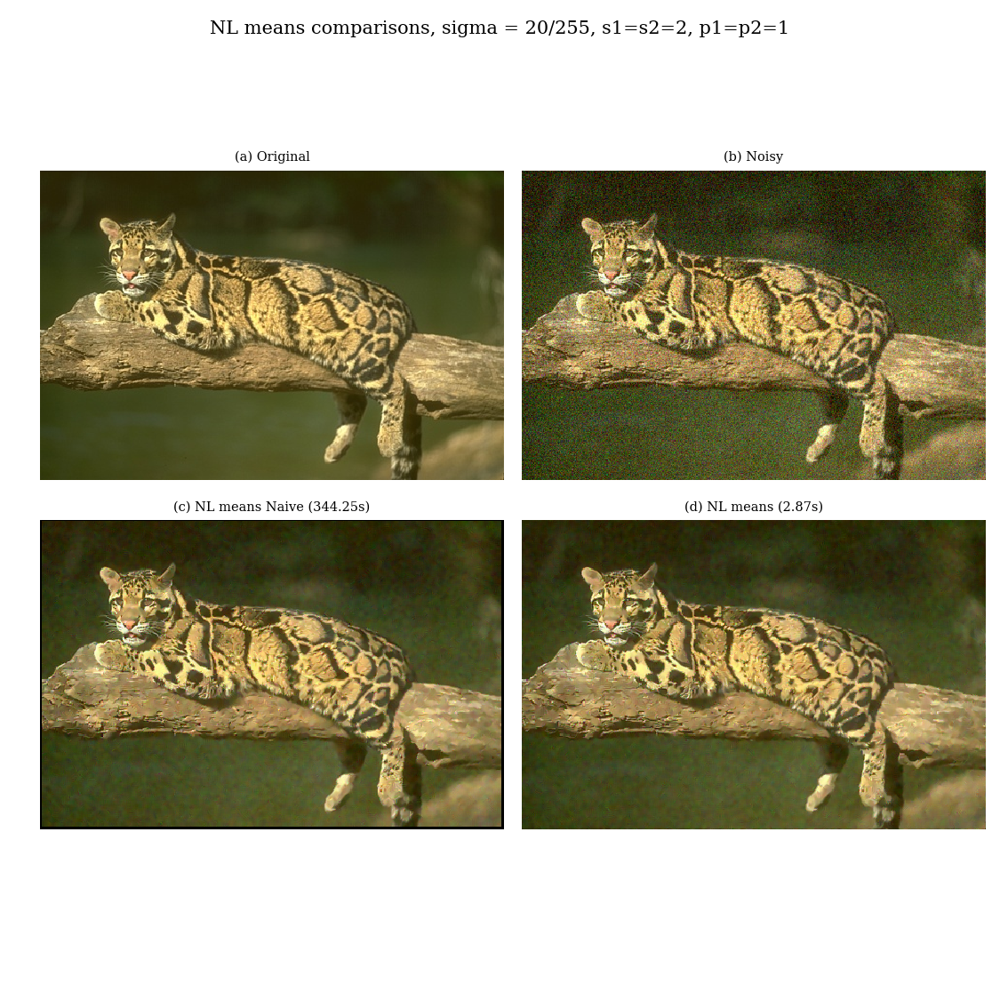

In [95]:
x = plt.imread('assets/leopard.png')
sig = 20/255
y = x + sig*np.random.randn(*x.shape)

t1=time.time()
yfst=nlmeans(y,sig,s1=2,s2=2,p1=1,p2=1)
t2=time.time()
tfst="{0:.2f}".format(t2-t1)

fig, axes = plt.subplots(ncols=2,nrows=2,figsize=(9, 9), sharex='all', sharey='all')

fig.suptitle('NL means comparisons, sigma = 20/255, s1=s2=2, p1=p2=1', fontsize=12)
axes[0,0].set_title('(a) Original')
im.show(x, ax=axes[0,0])

axes[0,1].set_title('(b) Noisy')
im.show(y, ax=axes[0,1])

axes[1,0].set_title('(c) NL means Naive ('+ tsloooow +'s)')
im.show(ysloooow,ax=axes[1,0])

axes[1,1].set_title('(d) NL means ('+ tfst +'s)')
im.show(yfst, ax=axes[1,1])



### 11

The theoretical complexity of both approaches is the same, $ O(n_1n_2s_1s_2p_1p_2)$. The improvement in run time is only due to the efficient implementations in Python.

### 12

In [3]:
def psnr(x, x0):
    R = x.max()
    n = x.size
    return 10*np.log10((R**2)/((1/n)*(np.linalg.norm(x-x0))**2))

In [4]:
x = plt.imread('assets/leopard.png')
sig = 20/255
y = x + sig*np.random.randn(*x.shape)
print(psnr(x,y))

22.094215445075815


### 13

<IPython.core.display.Javascript object>


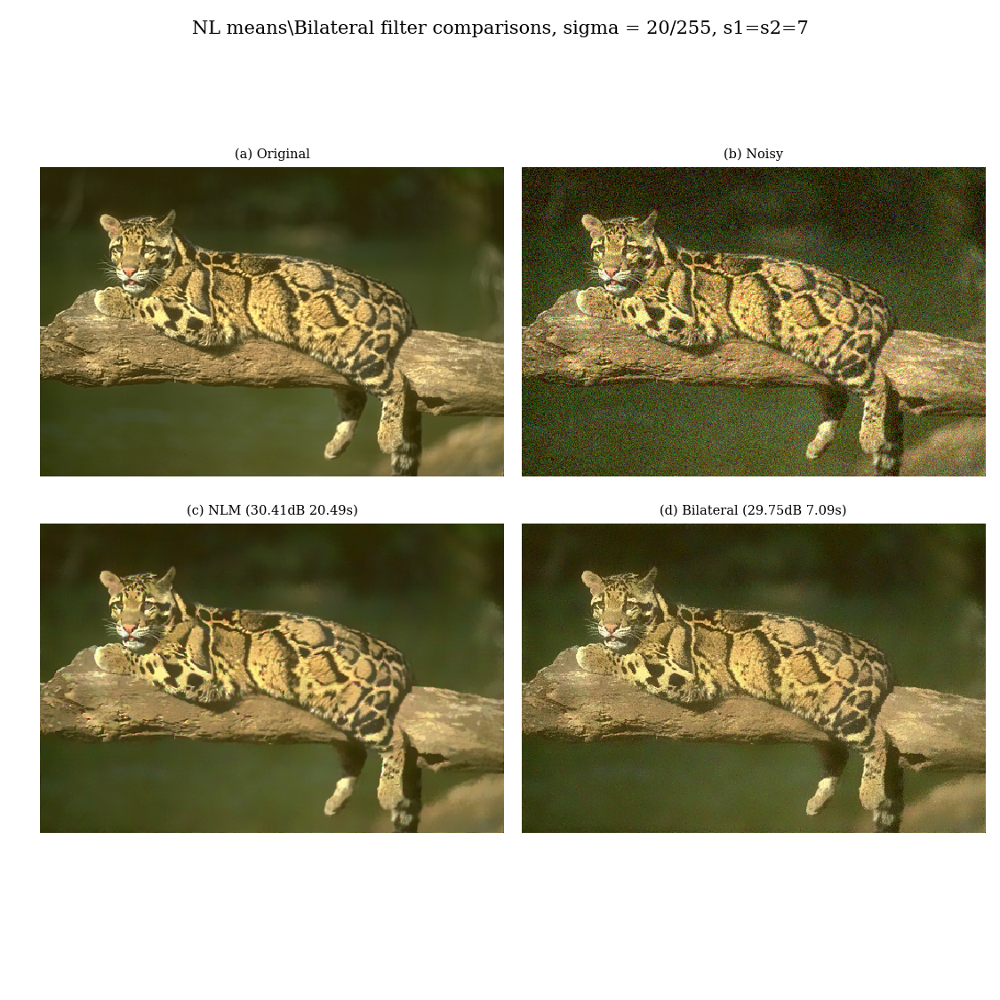

In [14]:
x = plt.imread('assets/leopard.png')
sig = 20/255
y = x + sig*np.random.randn(*x.shape)
h_test=1

t1=time.time()
yblt=bilateral(y,sig,s1=7,s2=7,h=h_test)
t2=time.time()
tblt="{0:.2f}".format(t2-t1)
psnrblt = "{0:.2f}".format(psnr(x,yblt))

t1=time.time()
ynlm=nlmeans(y,sig,s1=7,s2=7,p1=1,p2=1,h=h_test)
t2=time.time()
tnlm="{0:.2f}".format(t2-t1)
psnrnlm = "{0:.2f}".format(psnr(x,ynlm))

fig, axes = plt.subplots(ncols=2,nrows=2,figsize=(9, 9), sharex='all', sharey='all')

fig.suptitle('NL means\Bilateral filter comparisons, sigma = 20/255, s1=s2=7', fontsize=12)
axes[0,0].set_title('(a) Original')
im.show(x, ax=axes[0,0])

axes[0,1].set_title('(b) Noisy')
im.show(y, ax=axes[0,1])

axes[1,0].set_title('(c) NLM ('+ psnrnlm + 'dB ' + tnlm +'s)')
im.show(ynlm,ax=axes[1,0])

axes[1,1].set_title('(d) Bilateral ('+ psnrblt + 'dB '+ tblt +'s)')
im.show(yblt, ax=axes[1,1])


The NLM result is a bit better in terms of PSNR and visually. This is expected because the NLM takes into consideration locality in the different patches, unlike the bilateral filter.

### 14

<IPython.core.display.Javascript object>


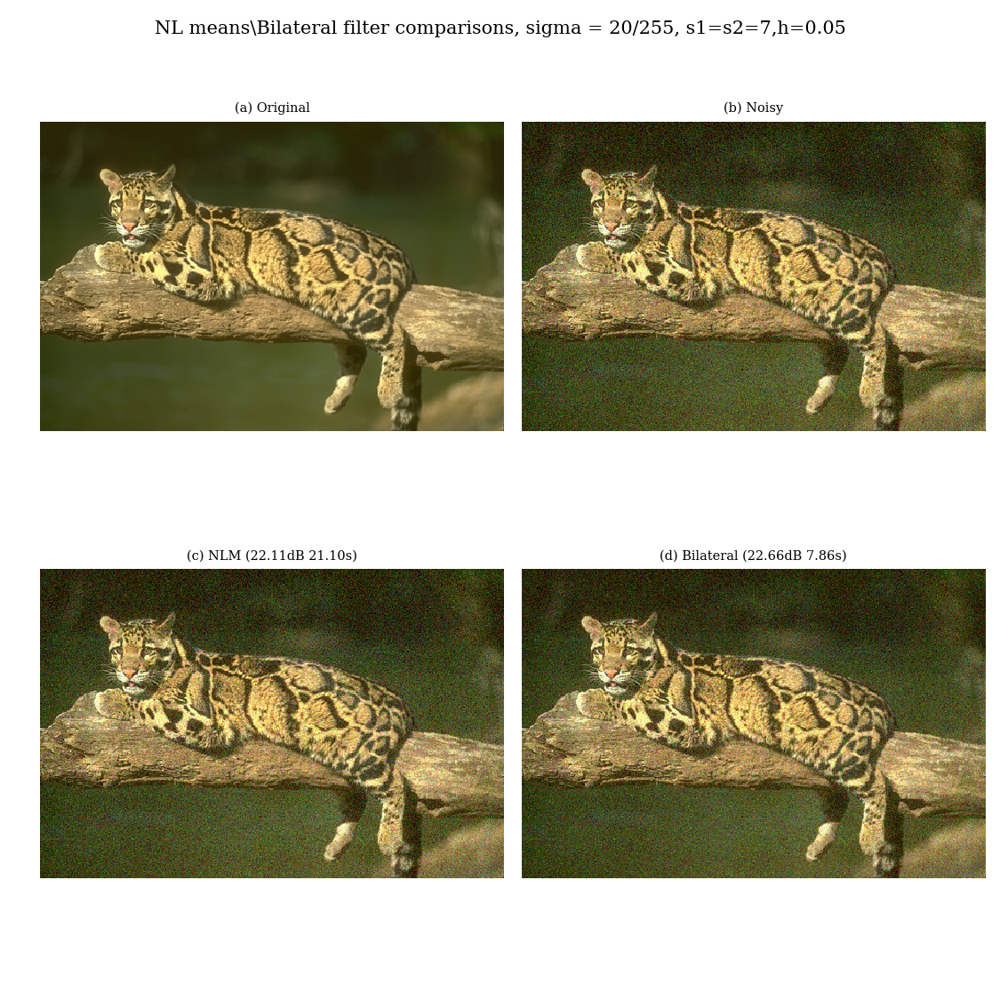

In [23]:
sig = 20/255
y = x + sig*np.random.randn(*x.shape)
h_test=0.05

t1=time.time()
yblt=bilateral(y,sig,s1=7,s2=7,h=h_test)
t2=time.time()
tblt="{0:.2f}".format(t2-t1)
psnrblt = "{0:.2f}".format(psnr(x,yblt))

t1=time.time()
ynlm=nlmeans(y,sig,s1=7,s2=7,p1=1,p2=1,h=h_test)
t2=time.time()
tnlm="{0:.2f}".format(t2-t1)
psnrnlm = "{0:.2f}".format(psnr(x,ynlm))

fig, axes = plt.subplots(ncols=2,nrows=2,figsize=(9, 9), sharex='all', sharey='all')

fig.suptitle('NL means\Bilateral filter comparisons, sigma = 20/255, s1=s2=7,h=0.05', fontsize=12)
axes[0,0].set_title('(a) Original')
im.show(x, ax=axes[0,0])

axes[0,1].set_title('(b) Noisy')
im.show(y, ax=axes[0,1])

axes[1,0].set_title('(c) NLM ('+ psnrnlm + 'dB ' + tnlm +'s)')
im.show(ynlm,ax=axes[1,0])

axes[1,1].set_title('(d) Bilateral ('+ psnrblt + 'dB '+ tblt +'s)')
im.show(yblt, ax=axes[1,1])

<IPython.core.display.Javascript object>


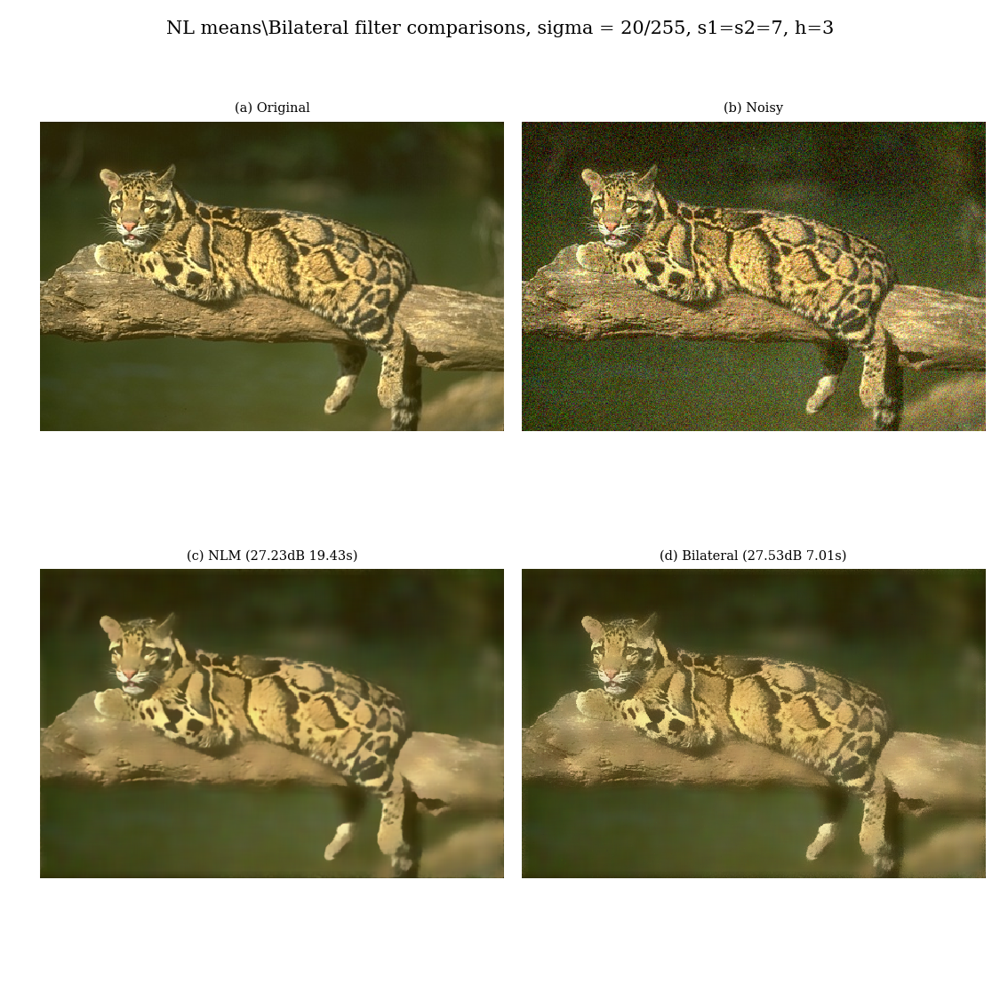

In [21]:
sig = 20/255
y = x + sig*np.random.randn(*x.shape)
h_test=3

t1=time.time()
yblt=bilateral(y,sig,s1=7,s2=7,h=h_test)
t2=time.time()
tblt="{0:.2f}".format(t2-t1)
psnrblt = "{0:.2f}".format(psnr(x,yblt))

t1=time.time()
ynlm=nlmeans(y,sig,s1=7,s2=7,p1=1,p2=1,h=h_test)
t2=time.time()
tnlm="{0:.2f}".format(t2-t1)
psnrnlm = "{0:.2f}".format(psnr(x,ynlm))

fig, axes = plt.subplots(ncols=2,nrows=2,figsize=(9, 9), sharex='all', sharey='all')

fig.suptitle('NL means\Bilateral filter comparisons, sigma = 20/255, s1=s2=7, h=3', fontsize=12)
axes[0,0].set_title('(a) Original')
im.show(x, ax=axes[0,0])

axes[0,1].set_title('(b) Noisy')
im.show(y, ax=axes[0,1])

axes[1,0].set_title('(c) NLM ('+ psnrnlm + 'dB ' + tnlm +'s)')
im.show(ynlm,ax=axes[1,0])

axes[1,1].set_title('(d) Bilateral ('+ psnrblt + 'dB '+ tblt +'s)')
im.show(yblt, ax=axes[1,1])

<IPython.core.display.Javascript object>


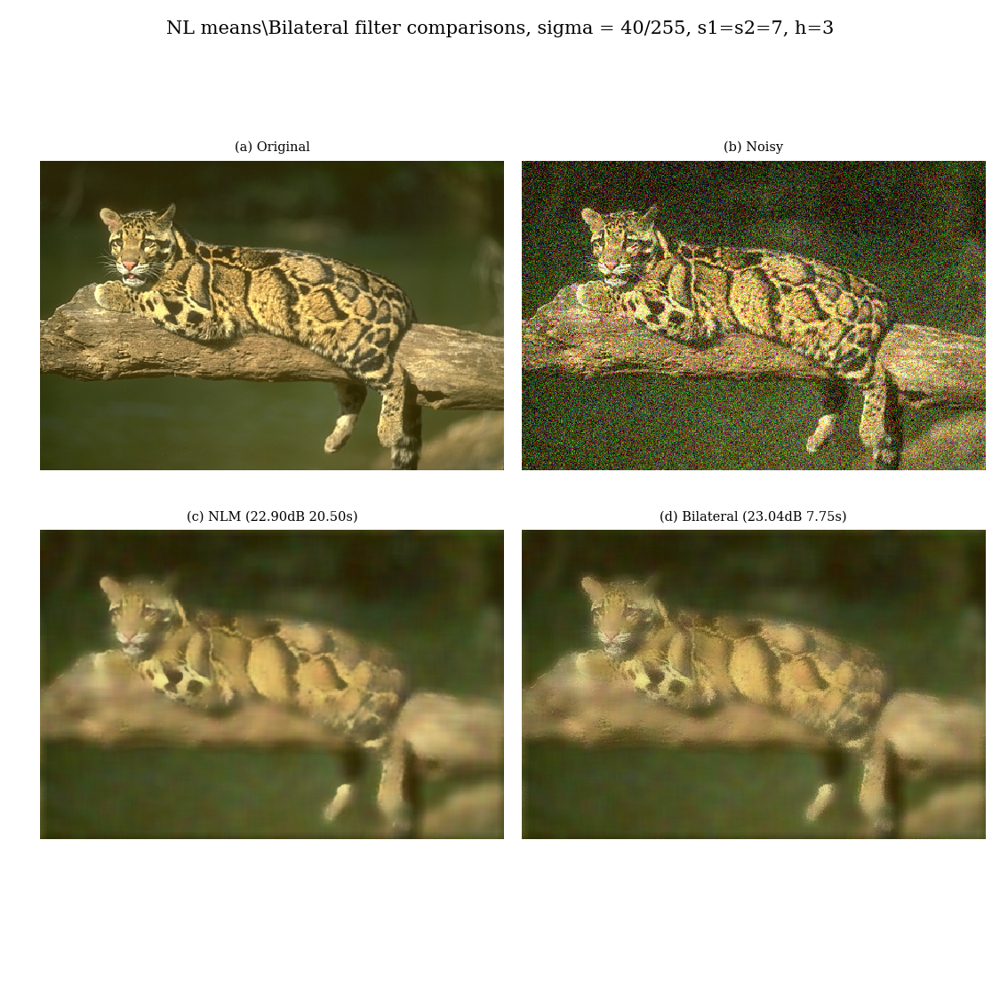

In [20]:
sig = 40/255
y = x + sig*np.random.randn(*x.shape)
h_test=3

t1=time.time()
yblt=bilateral(y,sig,s1=7,s2=7,h=h_test)
t2=time.time()
tblt="{0:.2f}".format(t2-t1)
psnrblt = "{0:.2f}".format(psnr(x,yblt))

t1=time.time()
ynlm=nlmeans(y,sig,s1=7,s2=7,p1=1,p2=1,h=h_test)
t2=time.time()
tnlm="{0:.2f}".format(t2-t1)
psnrnlm = "{0:.2f}".format(psnr(x,ynlm))

fig, axes = plt.subplots(ncols=2,nrows=2,figsize=(9, 9), sharex='all', sharey='all')

fig.suptitle('NL means\Bilateral filter comparisons, sigma = 40/255, s1=s2=7, h=3', fontsize=12)
axes[0,0].set_title('(a) Original')
im.show(x, ax=axes[0,0])

axes[0,1].set_title('(b) Noisy')
im.show(y, ax=axes[0,1])

axes[1,0].set_title('(c) NLM ('+ psnrnlm + 'dB ' + tnlm +'s)')
im.show(ynlm,ax=axes[1,0])

axes[1,1].set_title('(d) Bilateral ('+ psnrblt + 'dB '+ tblt +'s)')
im.show(yblt, ax=axes[1,1])

As the variance of the noise increases, so does the reconstruction become worse. As the filtering paramater changes, there is a trade-off between smoothing the noise and preserving the edges. h increases $\rightarrow$ result smoother but less noise. h decreases $\rightarrow$ better edge preservation but more noise. Notice the NLM filter is still slower than the assignment, but not by much, so I would think the implementation is good enough.